## 1 Download image and show

In [ ]:
import cv2 as cv
import numpy as np

img = cv.imread('/content/photo_2025-04-17_12-21-19.jpg')

# 2 Image &mdash; is `np.ndarray`


In [ ]:
type(img), img.shape

(numpy.ndarray, (667, 1000, 3))

Default channel order openCV &mdash; **BGR**.

980 - Height; 700 - width; 3 - channels

In [ ]:
import matplotlib.pyplot as plt

def side_by_side(*imgs):
    fig, axs = plt.subplots(1, len(imgs), figsize=(12, 12))

    for img, ax in zip(imgs, axs.ravel()):
        if img.shape[-1] == 3:
            img = img[:, :, ::-1]

        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(img, cmap='gray')

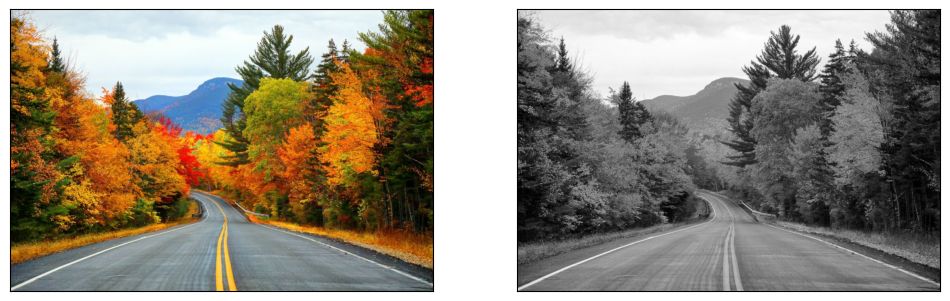

In [ ]:
img_gray_avg = img.mean(axis=-1)

side_by_side(img, img_gray_avg)

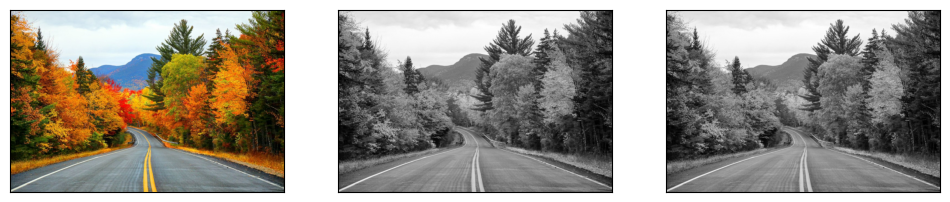

In [ ]:
img_1 = img.copy()

img_gray1 = cv.imread('/content/photo_2025-04-17_12-21-19.jpg', cv.IMREAD_GRAYSCALE)

img_gray = cv.cvtColor(img_1, cv.COLOR_BGR2GRAY)

side_by_side(img, img_gray, img_gray1)

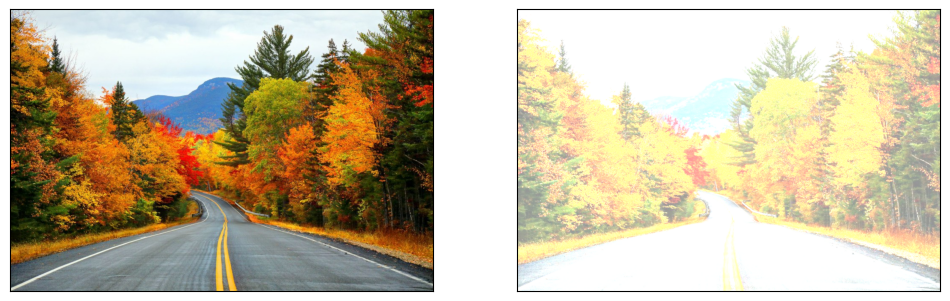

In [ ]:
img_brighter = np.clip((img.astype(np.float64) + 150), 0, 255).astype(np.uint8)

side_by_side(img, img_brighter)

# 3 Converting colors and channels

In [ ]:
from google.colab.patches import cv2_imshow

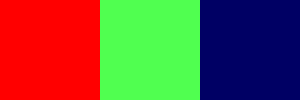

In [ ]:
img_squares = np.zeros((100, 300, 3), dtype=np.uint8)

img_squares[0:100, 0:100, 2] = 255
img_squares[0:100, 100:200, :] = [80, 255, 80]
img_squares[0:100, 200:300, 0] = 100

cv2_imshow(img_squares)

# OpenCV HSV:

<img src="https://i.stack.imgur.com/gyuw4.png" height=200px>

In [ ]:
img_squares_hsv = cv.cvtColor(img_squares, cv.COLOR_BGR2HSV)

img_squares_hsv[50, 50], img_squares_hsv[50, 150], img_squares_hsv[50, 250]

(array([  0, 255, 255], dtype=uint8),
 array([ 60, 175, 255], dtype=uint8),
 array([120, 255, 100], dtype=uint8))

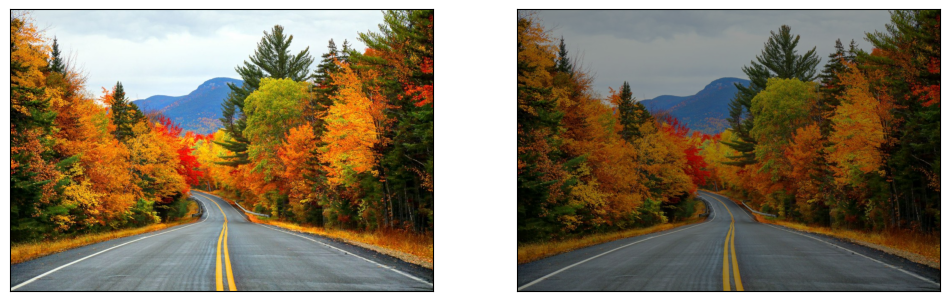

In [ ]:
img_hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

h, s, v = cv.split(img_hsv)
v = (v.astype(np.float64) * 0.6).astype(np.uint8)
img_hsv = cv.merge((h, s, v))
img_lowsat = cv.cvtColor(img_hsv, cv.COLOR_HSV2BGR)

side_by_side(img, img_lowsat)

# 4 Geometric transformations

## Resize

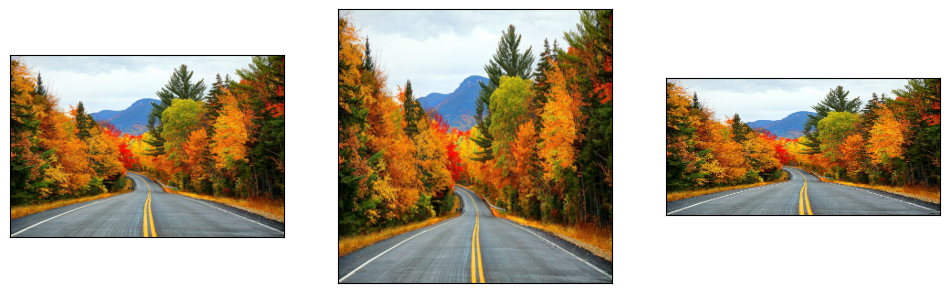

In [ ]:
img_tall = cv.resize(img, None, fx=1, fy=1.5)
img_short = cv.resize(img, (300, 150))

side_by_side(img, img_tall, img_short)

The function takes as the first argument the image whose size we want to resize, the second - a tuple that should contain the width and height for the new image, and the third - the interpolation method (optional). Interpolation is an algorithm that finds unknown intermediate values from a given set of known values.

Nearest neighbor interpolation (cv2.INTER_NEAREST) simply takes for each pixel of the final image one pixel of the original image that is closest to its position - this is the simplest and fastest way. In addition to this method, opencv has the following: cv2.INTER_AREA, cv2.INTER_LINEAR (default), cv2.INTER_CUBIC and cv2.INTER_LANCZOS4. The most preferred interpolation method for image compression is cv2.INTER_AREA, for enlargement - cv2.INTER_LINEAR.

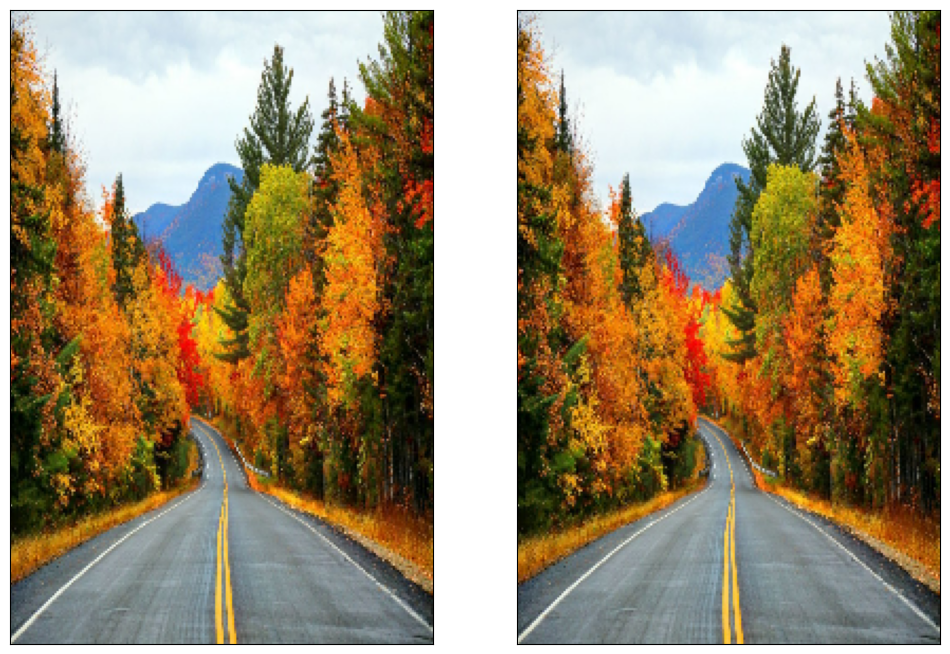

In [ ]:
res_img_nearest = cv.resize(img, (200, 300), cv.INTER_NEAREST)
res_img_linear = cv.resize(img, (200, 300), cv.INTER_LINEAR)

side_by_side(res_img_nearest, res_img_linear)

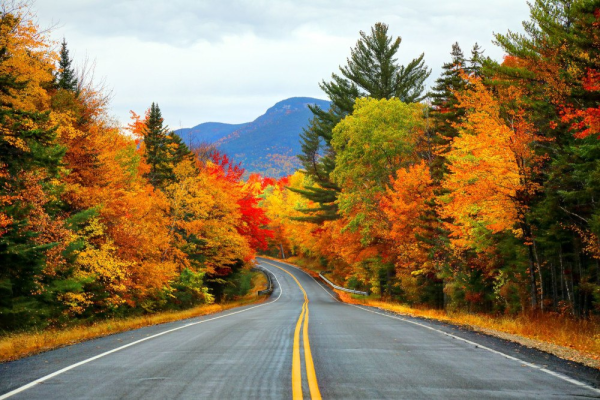

In [ ]:
#Prepare new sizes
final_wide = 600
r = float(final_wide) / img.shape[1]
dim = (final_wide, int(img.shape[0] * r))

# reduce the image to the prepared dimensions
resized = cv.resize(img, dim, interpolation = cv.INTER_AREA)
cv2_imshow(resized)


# cv.waitKey(0)
# cv.destroyAllWindows()

## Transfer

Affine transformation matrix:

$$M = \begin{bmatrix}
    \alpha_{11} & \alpha_{12} & t_x \\
    \alpha_{21} & \alpha_{22} & t_y
 \end{bmatrix}$$

Coefficients $t_x, t_y$ are used for bias (translation).

## Rotation

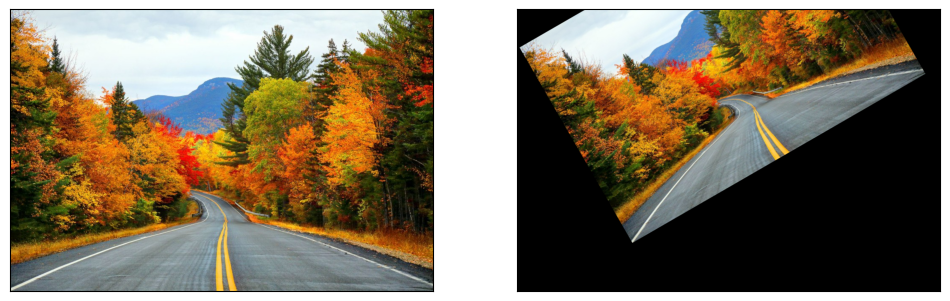

In [ ]:
M = cv.getRotationMatrix2D(center=(150, 100), angle=30, scale=0.8)
img_tr = cv.warpAffine(img, M, img.shape[1::-1])

side_by_side(img, img_tr)

When we rotate an image, we need to indicate which point we will rotate around, this is what the cv2.getRotationMatrix2D() function takes as the first argument. In this case, I specified the center of the image, but opencv allows you to specify any arbitrary point around which you want to rotate. The next argument this function takes is the angle by which we want to rotate our image, and the last argument is the scaling factor. We use 0.8, which means we reduce the image by 40% to fit the frame. This function returns a numpy array, which we pass as the second argument to the cv2.warpAffine() function.

## Three-point affine transformation

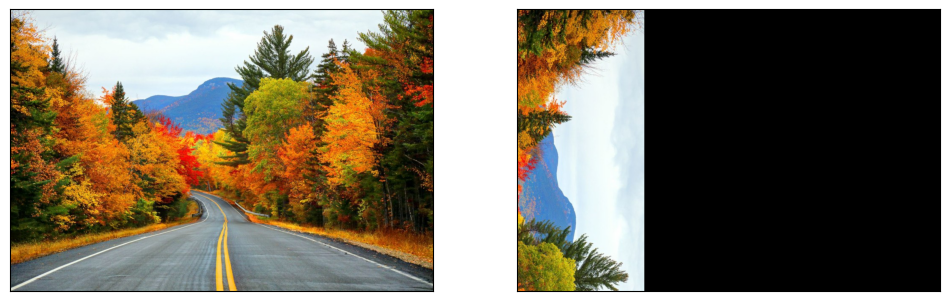

In [ ]:
pts_in = np.array([[100, 200], [100, 100], [200, 100]], dtype=np.float32)
pts_out = np.array([[100, 100], [200, 100], [200, 200]], dtype=np.float32)

M = cv.getAffineTransform(pts_in, pts_out)
img_tr = cv.warpAffine(img, M, img.shape[1::-1])

side_by_side(img, img_tr)

## Four-point perspective change

In [ ]:
!wget https://i.ibb.co/HVqMphz/wtNxqMx.png

--2025-04-23 03:05:16--  https://i.ibb.co/HVqMphz/wtNxqMx.png
Resolving i.ibb.co (i.ibb.co)... 108.181.22.211
Connecting to i.ibb.co (i.ibb.co)|108.181.22.211|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1884165 (1.8M) [image/png]
Saving to: ‘wtNxqMx.png.1’

wtNxqMx.png.1       100%[===================>]   1.80M  2.23MB/s    in 0.8s    

2025-04-23 03:05:18 (2.23 MB/s) - ‘wtNxqMx.png.1’ saved [1884165/1884165]



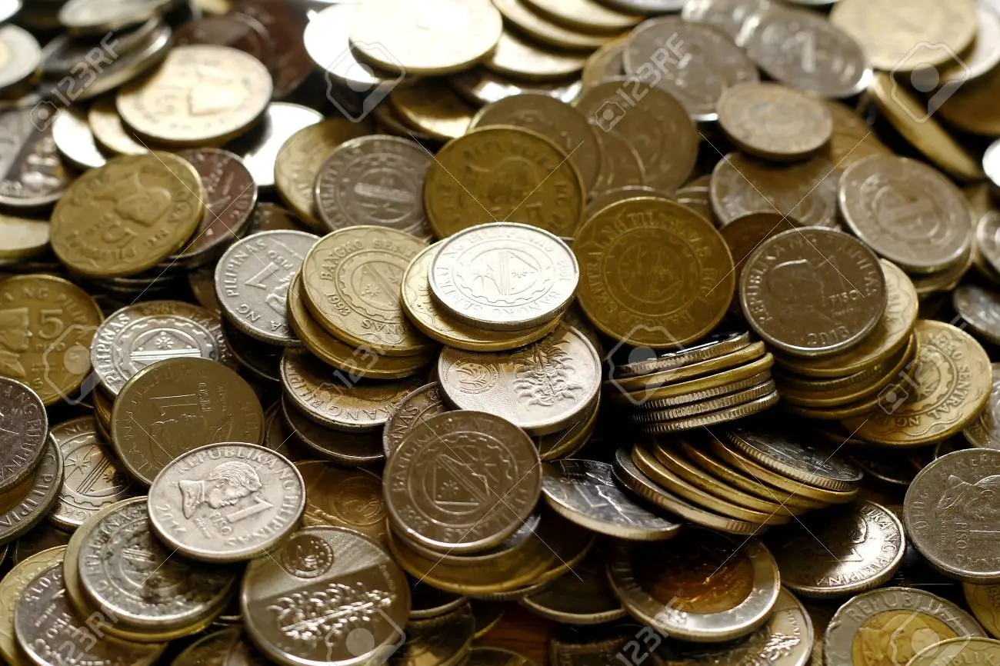

In [ ]:
img_coins = cv.imread('/content/wtNxqMx.png')

cv2_imshow(img_coins)

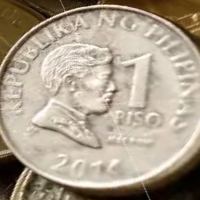

In [ ]:
pts_in = np.array([[336, 540], [433, 659], [244, 746], [151, 646]], dtype=np.float32)
pts_out = np.array([[0, 0], [200, 0], [200, 200], [0, 200]], dtype=np.float32)

M = cv.getPerspectiveTransform(pts_in, pts_out)
img_tr = cv.warpPerspective(img_coins, M, (200, 200))

cv2_imshow(img_tr)

# 5 Tasks

## 5.1 Make the image black and white

Instead of the usual arithmetic average across channels, use a weighted sum taking into account the sensitivity of the human eye:

$$0.299 \cdot R + 0.587 \cdot G + 0.114 \cdot B$$

Compare with simple averaging.

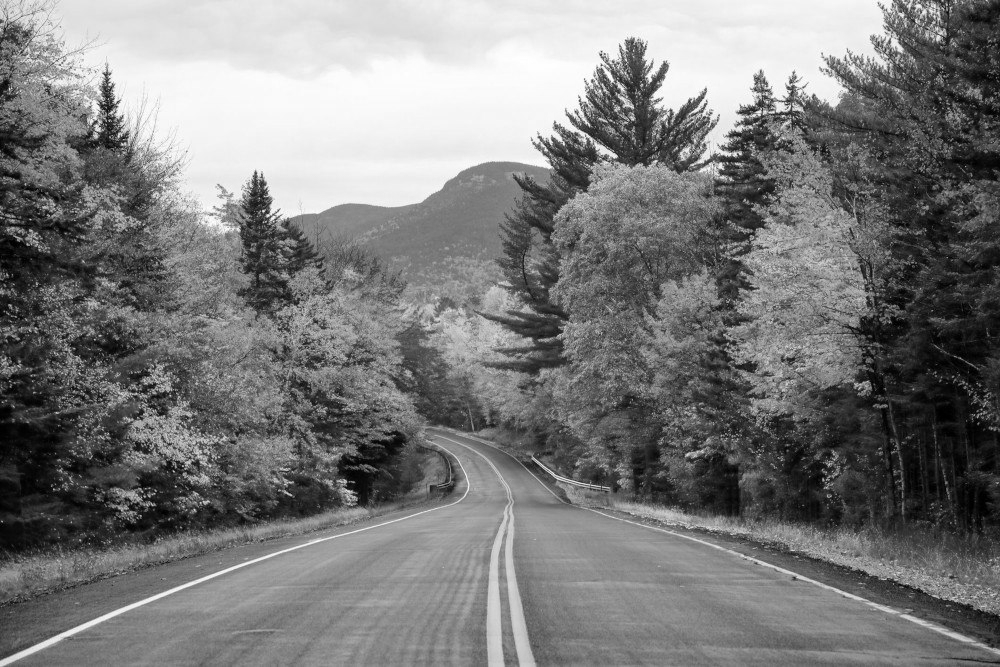

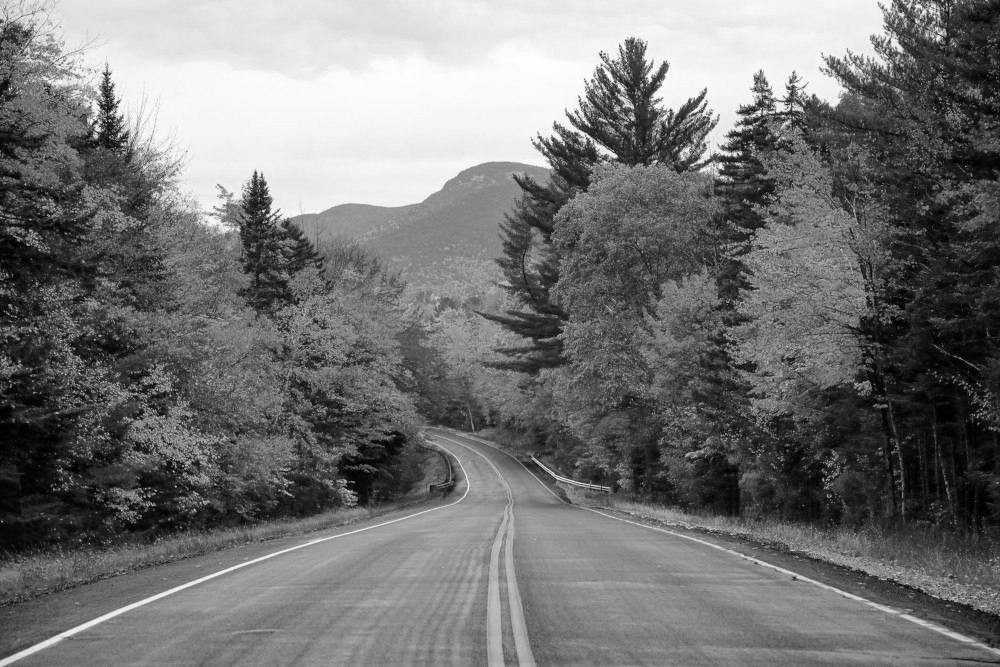

In [ ]:
img1 = cv.imread('/content/photo_2025-04-17_12-21-19.jpg')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
gray_weighted = 0.299 * img_rgb[:, :, 0] + 0.587 * img_rgb[:, :, 1] + 0.114 * img_rgb[:, :, 2]
gray_weighted = gray_weighted.astype(np.uint8)

gray_avg = img.mean(axis=2).astype(np.uint8)

cv2_imshow(gray_weighted)
cv2_imshow(gray_avg)

In [ ]:
!wget https://i.ibb.co/TDFTj16g/26TGRo0.jpg

--2025-04-23 03:05:19--  https://i.ibb.co/TDFTj16g/26TGRo0.jpg
Resolving i.ibb.co (i.ibb.co)... 108.181.22.211
Connecting to i.ibb.co (i.ibb.co)|108.181.22.211|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 339147 (331K) [image/jpeg]
Saving to: ‘26TGRo0.jpg.1’

26TGRo0.jpg.1       100%[===================>] 331.20K  --.-KB/s    in 0.1s    

2025-04-23 03:05:19 (2.68 MB/s) - ‘26TGRo0.jpg.1’ saved [339147/339147]



In [ ]:
img4 = cv.imread('/content/26TGRo0.jpg')

In [ ]:
img_gray_avg4 = img4.mean(axis=-1)
img_gray_wgh4 = np.average(img4, axis=-1, weights=[0.114, 0.587, 0.299])

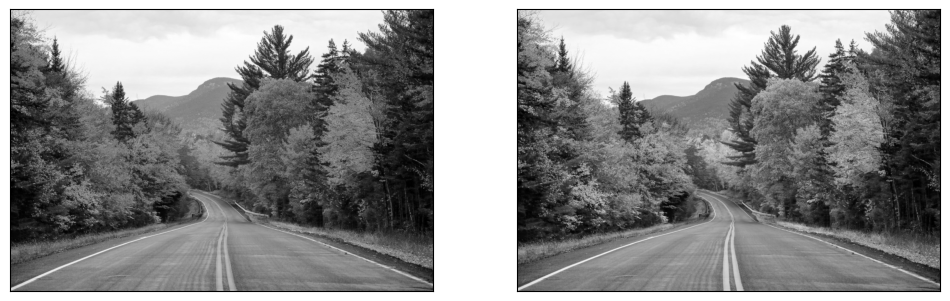

In [ ]:
side_by_side (img_gray_avg4, img_gray_wgh4)

## 5.2 Make the colors in the picture more saturated and increase the brightness

In [ ]:
!wget https://i.ibb.co/39v8wTvw/NIdrThO.png

--2025-04-23 03:05:20--  https://i.ibb.co/39v8wTvw/NIdrThO.png
Resolving i.ibb.co (i.ibb.co)... 108.181.22.211
Connecting to i.ibb.co (i.ibb.co)|108.181.22.211|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 438334 (428K) [image/png]
Saving to: ‘NIdrThO.png’

NIdrThO.png         100%[===================>] 428.06K   114KB/s    in 3.8s    

2025-04-23 03:05:25 (114 KB/s) - ‘NIdrThO.png’ saved [438334/438334]



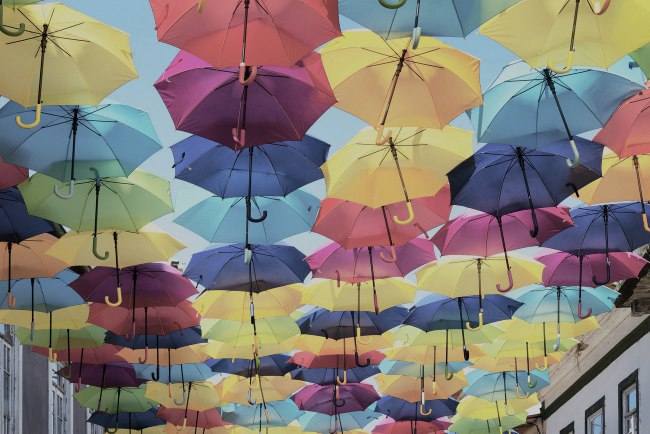

In [ ]:
img_umbr = cv.imread('/content/photo_2025-04-17_13-12-00.jpg')

cv2_imshow(img_umbr)

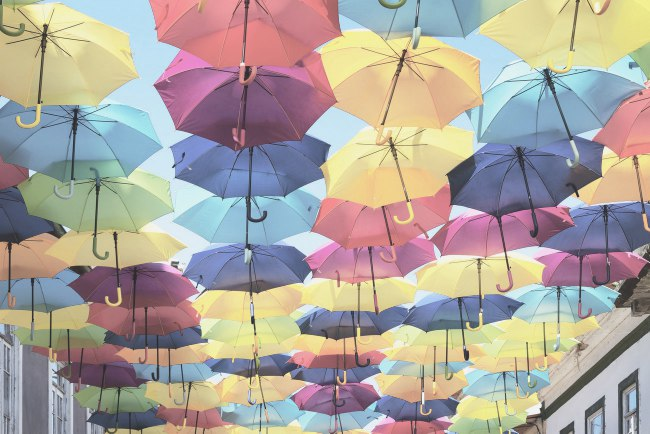

In [ ]:
img_brigh = np.clip((img_umbr.astype(np.float64) + 40), 0, 255).astype(np.uint8)

cv2_imshow(img_brigh)

## 5.3 Return the image to its original state

In [ ]:
!wget https://i.ibb.co/HTpMv8JV/transf.jpg

--2025-04-23 03:05:25--  https://i.ibb.co/HTpMv8JV/transf.jpg
Resolving i.ibb.co (i.ibb.co)... 108.181.22.211
Connecting to i.ibb.co (i.ibb.co)|108.181.22.211|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 31568 (31K) [image/jpeg]
Saving to: ‘transf.jpg.1’

transf.jpg.1        100%[===================>]  30.83K  --.-KB/s    in 0.03s   

2025-04-23 03:05:34 (1024 KB/s) - ‘transf.jpg.1’ saved [31568/31568]



In [ ]:
from PIL import Image
import requests
from io import BytesIO

# URL of the image
url = "https://i.ibb.co/JcWHPJh/bAwIda0.png"

# Send a GET request to the image URL
response = requests.get(url)

# Read the content of the image
img = Image.open(BytesIO(response.content))

# Display the image using the default image viewer
img.show()

## 5.4 Select the newspaper from table

The corners of the newspaper are given **from the top left clockwise**.

In [ ]:
!wget https://i.ibb.co/gLJZFkfc/NSp.png

--2025-04-23 03:05:34--  https://i.ibb.co/gLJZFkfc/NSp.png
Resolving i.ibb.co (i.ibb.co)... 108.181.22.211
Connecting to i.ibb.co (i.ibb.co)|108.181.22.211|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 690004 (674K) [image/png]
Saving to: ‘NSp.png.1’

NSp.png.1           100%[===================>] 673.83K  3.09MB/s    in 0.2s    

2025-04-23 03:05:35 (3.09 MB/s) - ‘NSp.png.1’ saved [690004/690004]



In [ ]:
!pip install opencv-python


In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow


In [ ]:
img5 = cv.imread('/content/NSp.png')

In [ ]:
print(img5.shape)

(421, 640, 3)


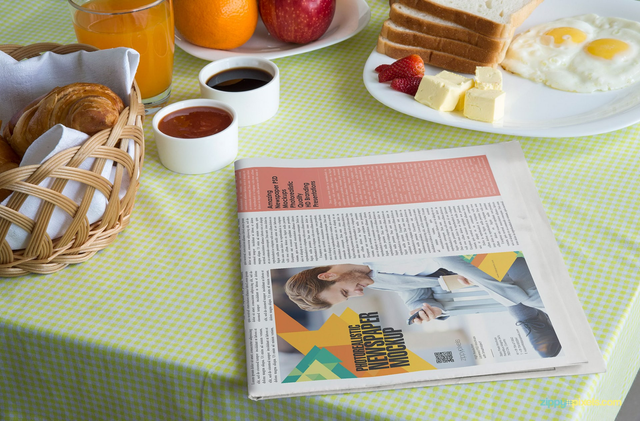

In [ ]:
cv2_imshow(img5)

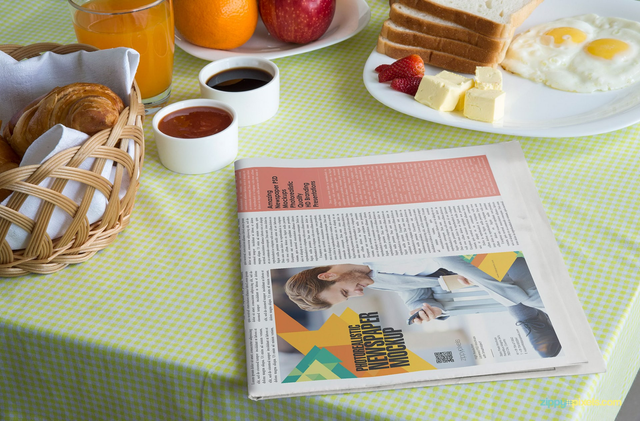

In [ ]:
#Newspaper corners on original shape

import cv2 as cv
import numpy as np

# Assuming you have already loaded your image as img5
# img5 = cv.imread('/content/NSp.png')

# Define the corners of the newspaper in img5
newspaper_corners = np.array([[759, 1181], [711, 487], [1512, 435], [1753, 1081]], dtype=np.float32)

# Create a copy of the original image to draw on
img5_with_corners = img5.copy()

# Draw circles at each corner point
for corner in newspaper_corners:
    x, y = corner.astype(int)  # Convert coordinates to integers
    cv.circle(img5_with_corners, (x, y), radius=5, color=(0, 255, 0), thickness=-1)  # Green circles

# Display the image with corners
from google.colab.patches import cv2_imshow
cv2_imshow(img5_with_corners)

In [ ]:
print(M)

[[-6.87311457e-02 -6.83187589e-01  8.59011482e+02]
 [ 4.26831988e-01 -2.95215208e-02 -2.89100563e+02]
 [-3.21012864e-05  4.44357738e-04  1.00000000e+00]]


Understanding the Transformation Matrix

The transformation matrix you provided is a 3x3 matrix representing a perspective transformation. It's used to map points from the original image to the transformed image. The matrix has the following form:

[[a, b, c],
 [d, e, f],
 [g, h, i]]
Use code with caution
where:

a, b, d, e control scaling, rotation, and shearing.
c, f control translation.
g, h, i control perspective distortion.
Deducing newspaper_corners

To deduce reasonable values for newspaper_corners, we need to consider the following:

Output Size: You previously mentioned an output_size of (400, 300). This means the transformed image will have these dimensions.

Perspective Transformation: The perspective transformation maps the corners of the newspaper in the original image to the corners of the output image.

Matrix Values: The values in the transformation matrix provide information about the mapping.

Based on these considerations, we can make the following assumptions:

The newspaper_corners should define a quadrilateral in the original image that roughly corresponds to the newspaper's shape.
The transformed corners of this quadrilateral should map to the corners of the output image: (0, 0), (400, 0), (400, 300), (0, 300).
Estimating newspaper_corners

Since we don't have the exact mapping between the original and transformed points, we can only estimate reasonable values for newspaper_corners. Here's a possible approach:

Consider the translation components: The c and f values in the matrix (859.01 and -289.10) roughly represent the translation applied to the x and y coordinates, respectively. This suggests that the newspaper's center might be located around (859, -289) in the original image. This is not logical as y coordinates cannot be negative. However it shows that these values should be large and of opposite signs.

Consider the scaling and rotation: The a, b, d, e values control scaling and rotation. Since we don't have specific information about these transformations, we can assume a moderate scale and rotation.

Estimate corner positions: Based on the translation and scale/rotation assumptions, we can estimate the approximate positions of the newspaper_corners. For example, the top-left corner might be located around (859 - delta_x, -289 - delta_y), where delta_x and delta_y are values that account for the scale and rotation. They also have to be large to compensate the translation values.

Example Values (Illustrative)

Given the considerations above, here's an example set of values for newspaper_corners that might be reasonable to try:

newspaper_corners = np.array([[759, 1181], [711, 487], [1512, 435], [1753, 1081]], dtype=np.float32)
Use code with caution
Important Considerations

These values are estimates and might not be perfectly accurate. You might need to adjust them based on the actual content of your image and the desired outcome.
The quality of the perspective transformation depends heavily on the accuracy of the newspaper_corners. Experiment with different values to achieve the best results.
The estimated values may result in an incorrect or out-of-bounds transformation if the translation values (c, f) are too large. Consider trying smaller values for (c, f) while keeping the sign, and make large adjustments for the newspaper_corners values to compensate.


In [ ]:
newspaper_corners = np.array([[759, 1181], [711, 487], [1512, 435], [1753, 1081]], dtype=np.float32)

This method is not plotting the newspaper extract, the corners are for the image not the newspaper extract.

In [ ]:
#Define output size
output_size = (400, 300)  # Adjust as needed

In [ ]:
#Recalculate the transformation matrix
M = cv.getPerspectiveTransform(newspaper_corners, np.float32([[0, 0], [output_size[0], 0], [output_size[0], output_size[1]], [0, output_size[1]]]))

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)
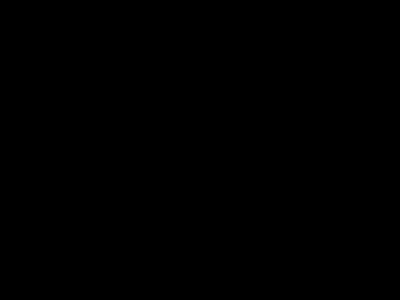

In [ ]:
transformed_img = cv.warpPerspective(img5, M, output_size)
from IPython.display import display
display(transformed_img)

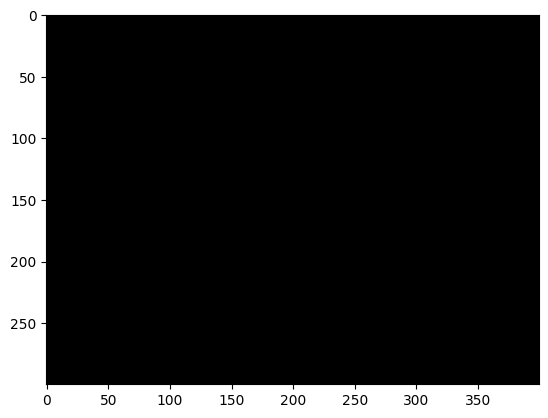

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(transformed_img)  # Convert color space for Matplotlib
plt.show()

In [ ]:
image_path = '/content/NSp.png'

In [ ]:
img5 = cv.imread('/content/NSp.png')

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow  # Import cv2_imshow
import cv2

def find_newspaper_corners(image_path):
    # Load the image
    img = cv.imread(image_path)

    if img is None:
        print(f"Error: Could not load image from {image_path}")
        return None  # Or raise an exception

    orig = img.copy()

    # Convert to grayscale and apply blur
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)

    # Edge detection
    edged = cv2.Canny(gray, 75, 200)

    # Find contours
    contours, _ = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]

    # Initialize screenCnt to None
    screenCnt = None

    # Loop over contours to find quadrilateral
    for contour in contours:
        peri = cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, 0.02 * peri, True)

        # If our approximated contour has four points, we can assume we've found the newspaper
        if len(approx) == 4:
            screenCnt = approx
            break

    # Check if screenCnt was assigned a value
    if screenCnt is not None:
        # Draw the corners
        for i, corner in enumerate(screenCnt):
            x, y = corner.ravel()
            cv2.circle(img, (x, y), 10, (0, 255, 0), -1)
            cv2.putText(img, f"{i+1}", (x, y), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

        cv2_imshow(img)  # Use cv2_imshow instead of cv2.imshow
        cv2.waitKey(0)
        cv2.destroyAllWindows()

        return screenCnt.reshape(4, 2)
    else:
        print("No quadrilateral contour found")
        return None

# Usage
corners = find_newspaper_corners("/content/NSp.png")
print("Detected corners:", corners)

No quadrilateral contour found
Detected corners: None


In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow
import cv2

def find_newspaper_corners(image_path, canny_thresh1=50, canny_thresh2=150, approx_epsilon_factor=0.02):
    """
    Finds the corners of a newspaper in an image.

    Args:
        image_path (str): Path to the image file.
        canny_thresh1 (int): Lower threshold for Canny edge detection.
        canny_thresh2 (int): Upper threshold for Canny edge detection.
        approx_epsilon_factor (float): Factor to multiply by the contour perimeter
                                        to determine the approximation accuracy in cv2.approxPolyDP.

    Returns:
        numpy.ndarray or None: A NumPy array of shape (4, 2) representing the
                               four corners of the newspaper if found, otherwise None.
    """
    img = cv.imread(image_path)

    if img is None:
        print(f"Error: Could not load image from {image_path}")
        return None

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)

    edged = cv2.Canny(gray, canny_thresh1, canny_thresh2)  # Adjust thresholds

    contours, _ = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]  # Consider more contours

    screenCnt = None

    for contour in contours:
        peri = cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, approx_epsilon_factor * peri, True)  # Adjust epsilon

        if len(approx) == 4:
            screenCnt = approx
            break

    if screenCnt is not None:
        # Draw the corners
        for i, corner in enumerate(screenCnt):
            x, y = corner.ravel()
            cv2.circle(img, (x, y), 10, (0, 255, 0), -1)
            cv2.putText(img, f"{i+1}", (x, y), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

        cv2_imshow(img)  # Use cv2_imshow instead of cv2.imshow
        cv2.waitKey(0)
        cv2.destroyAllWindows()

        return screenCnt.reshape(4, 2)
    else:
        print("No quadrilateral contour found")
        return None

# Usage:
corners = find_newspaper_corners("/content/NSp.png", canny_thresh1=30, canny_thresh2=100, approx_epsilon_factor=0.01)
print("Detected corners:", corners)

No quadrilateral contour found
Detected corners: None


In [ ]:
import cv2
import numpy as np

def harris_corner_detection(image_path):
    # Load image
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Harris corner detection parameters
    gray = np.float32(gray)
    blockSize = 2
    ksize = 3
    k = 0.04

    # Detect corners
    dst = cv2.cornerHarris(gray, blockSize, ksize, k)

    # Result is dilated for marking the corners
    dst = cv2.dilate(dst, None)

    # Threshold for an optimal value (may need adjustment)
    img[dst > 0.01 * dst.max()] = [0, 0, 255]

    cv2.imshow('Harris Corners', img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Usage
harris_corner_detection("newspaper.jpg")

In [ ]:
import cv2
import numpy as np

def find_newspaper_corners_png(image_path):
    # Load the image with alpha channel if present
    img = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)

    # Handle PNG transparency by creating white background
    if img.shape[2] == 4:  # If PNG with alpha channel
        alpha = img[:,:,3]
        rgb = img[:,:,:3]

        # Create white background
        white_bg = np.ones_like(rgb, dtype=np.uint8) * 255

        # Blend with alpha
        img = cv2.bitwise_and(white_bg, white_bg, mask=cv2.bitwise_not(alpha)) + \
              cv2.bitwise_and(rgb, rgb, mask=alpha)

    orig = img.copy()

    # Convert to grayscale and apply blur
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)

    # Edge detection - may need to adjust thresholds
    edged = cv2.Canny(gray, 50, 150)

    # Find contours
    contours, _ = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]

    screenCnt = None
    # Loop over contours to find quadrilateral
    for contour in contours:
        peri = cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, 0.02 * peri, True)

        # If our approximated contour has four points, we can assume we've found the newspaper
        if len(approx) == 4:
            screenCnt = approx
            break

    if screenCnt is None:
        print("Could not find four corners")
        return None

    # Draw the corners
    for i, corner in enumerate(screenCnt):
        x, y = corner.ravel()
        cv2.circle(img, (x, y), 10, (0, 255, 0), -1)
        cv2.putText(img, f"{i+1}", (x, y), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

    cv2.imshow("Detected Corners", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

    return screenCnt.reshape(4, 2)

# Usage
corners = find_newspaper_corners_png("/content/NSp.png")
if corners is not None:
    print("Detected corners:", corners)

Could not find four corners


READ CORNERS PIPELINE

In [ ]:
from google.colab import files
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Upload your PNG file
uploaded = files.upload()
image_path = list(uploaded.keys())[0]  # Gets the uploaded filename (e.g., "NSp.png")

Saving NSp.png to NSp (1).png


LOAD AND PREPROCESS IMAGE

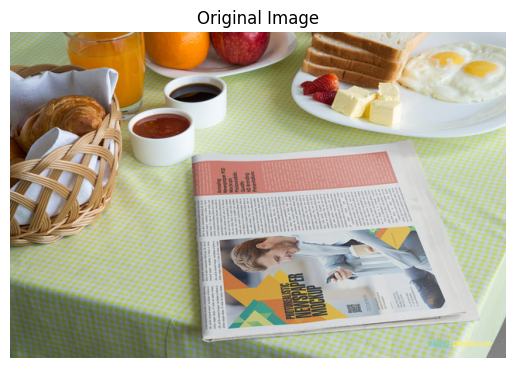

In [ ]:
# Load image (handles transparency if PNG has alpha channel)
img = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)

# If transparent, blend with white background
if img.shape[2] == 4:
    alpha = img[:,:,3]
    rgb = img[:,:,:3]
    white_bg = np.ones_like(rgb) * 255
    img = np.where(alpha[:,:,None] > 0, rgb, white_bg).astype(np.uint8)

# Convert to grayscale & blur
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = cv2.GaussianBlur(gray, (5, 5), 0)

# Display original
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')
plt.show()

DETECT NEWSPAPE CORNERS

In [ ]:
# Adaptive thresholding (better than Canny for documents)
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                              cv2.THRESH_BINARY_INV, 21, 10)

# Find contours (focus on external ones)
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Sort by area and get the largest quadrilateral
contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]
corners = None

for cnt in contours:
    peri = cv2.arcLength(cnt, True)
    approx = cv2.approxPolyDP(cnt, 0.02 * peri, True)
    if len(approx) == 4:  # Found 4 corners?
        corners = approx.reshape(4, 2)
        break

if corners is None:
    print("❌ Could not detect 4 corners. Try adjusting `approxPolyDP` or thresholds.")
else:
    print("✅ Detected corners at:", corners)

❌ Could not detect 4 corners. Try adjusting `approxPolyDP` or thresholds.


ORB FEATURE MATCHING

✅ Detected corners: [[549.3844  293.05716]
 [555.4043  297.41623]
 [552.833   293.424  ]
 [552.3662  297.1937 ]]


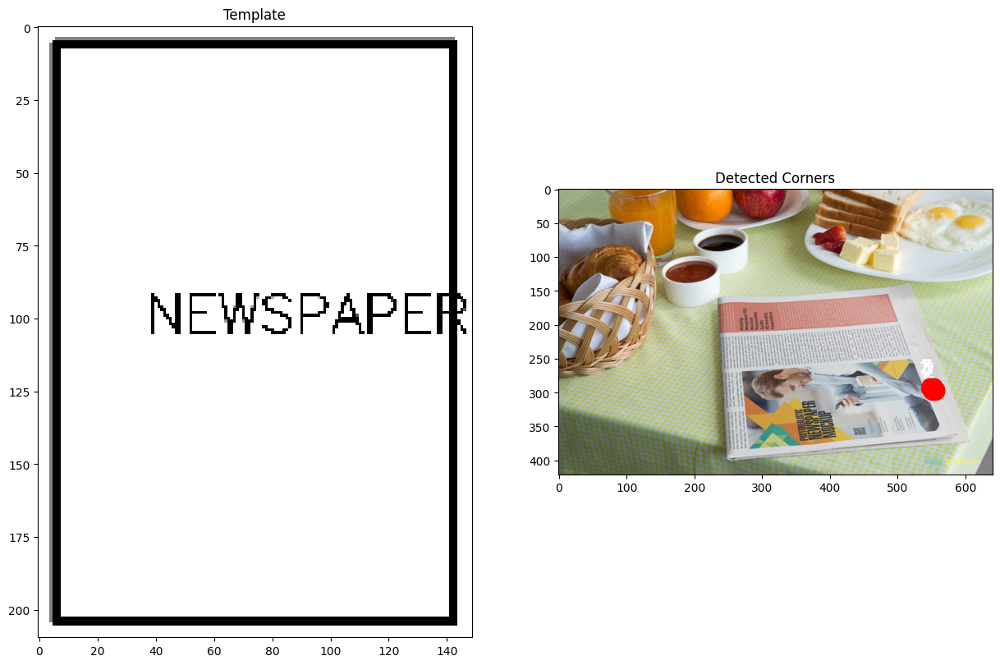

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# 1. Load and Preprocess Image ==============================================
def load_image(image_path):
    img = cv2.imread(image_path)
    if img is None:
        img = cv2.imdecode(np.fromfile(image_path, dtype=np.uint8), cv2.IMREAD_COLOR)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# 2. Create a Synthetic Newspaper Template ==================================
def create_template():
    # A4 paper size (210x297mm) in 300dpi (~2480x3508 pixels)
    h, w = 3508, 2480
    template = np.zeros((h, w, 3), dtype=np.uint8)
    template[:] = 255  # White background

    # Add some fake content to help feature detection
    cv2.putText(template, "NEWSPAPER", (w//4, h//2),
                cv2.FONT_HERSHEY_SIMPLEX, 10, (0,0,0), 20)
    cv2.rectangle(template, (100,100), (w-100,h-100), (0,0,0), 50)
    return template

# 3. Feature-Based Corner Detection =========================================
def detect_corners_orb(img, template):
    # Initialize ORB detector
    orb = cv2.ORB_create(50000)

    # Find keypoints and descriptors
    kp1, des1 = orb.detectAndCompute(template, None)
    kp2, des2 = orb.detectAndCompute(img, None)

    # Match features
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)[:100]  # Top 100 matches

    # Get matching points
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1,1,2)

    # Find homography
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Get template corners transformed to image space
    h, w = template.shape[:2]
    pts = np.float32([[0,0], [0,h-1], [w-1,h-1], [w-1,0]]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts, M)

    return dst.reshape(4,2)

# 4. Main Execution ========================================================
def main(image_path):
    # Load images
    img = load_image(image_path)
    template = create_template()

    # Resize template to match image scale
    scale = min(img.shape[0]/template.shape[0], img.shape[1]/template.shape[1])
    template = cv2.resize(template, (0,0), fx=scale*0.5, fy=scale*0.5)

    # Detect corners
    try:
        corners = detect_corners_orb(img, template)
        print("✅ Detected corners:", corners)

        # Draw results
        img_draw = img.copy()
        for i, (x,y) in enumerate(corners):
            cv2.circle(img_draw, (int(x), int(y)), 15, (255,0,0), -1)
            cv2.putText(img_draw, str(i+1), (int(x)-20, int(y)-20),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)

        # Show comparison
        plt.figure(figsize=(15,10))
        plt.subplot(121), plt.imshow(template), plt.title("Template")
        plt.subplot(122), plt.imshow(img_draw), plt.title("Detected Corners")
        plt.show()

    except Exception as e:
        print("❌ Error:", e)
        print("Trying manual corner selection...")
        plt.imshow(img)
        plt.title("Click 4 corners starting from top-left, clockwise")
        plt.axis('off')
        corners = plt.ginput(4, timeout=0)
        plt.close()
        print("Manual corners:", corners)

# Run it
image_path = "/content/NSp.png"
main(image_path)

This method helps by allowing the user to manually pick the cordinates from the image. A number of cordinates can be picked depending on the shape of the object. The picked cordinates can then be used to extract the required object from the image. The following code shows how to extract images with four corners using the newspaper image above and the cordinates shown


ORB + COLOUR ENHANCED DETECTION WITH MANUAL PICKING FALLBACK

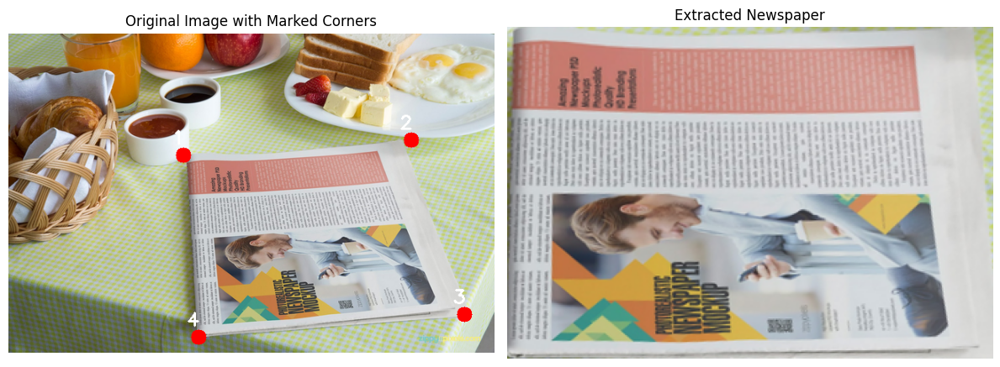

Manually Selected Corner Coordinates:
Corner 1: (230.0, 160.0)
Corner 2: (530.0, 140.0)
Corner 3: (600.0, 370.0)
Corner 4: (250.0, 400.0)

Saved files:
- original_with_corners.jpg
- extracted_newspaper.jpg


In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the original image
image_path = "/content/NSp.png"
original_img = cv2.imread(image_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)  # Convert to RGB for matplotlib

# Manually selected corners (in order: top-left, top-right, bottom-right, bottom-left)
manual_corners = np.array([
    [230, 160],  # Top-left
    [530, 140],  # Top-right
    [600, 370],  # Bottom-right
    [250, 400]   # Bottom-left
], dtype=np.float32)

# 1. Create a function to perform perspective transform
def four_point_transform(image, pts):
    # Obtain consistent order of points and unpack them
    rect = order_points(pts)
    (tl, tr, br, bl) = rect

    # Compute width of new image
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))

    # Compute height of new image
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))

    # Destination points for transform
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype="float32")

    # Compute perspective transform matrix and apply it
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
    return warped

def order_points(pts):
    # Initialize coordinates in order: top-left, top-right, bottom-right, bottom-left
    rect = np.zeros((4, 2), dtype="float32")

    # Top-left point will have smallest sum
    # Bottom-right point will have largest sum
    s = pts.sum(axis=1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]

    # Top-right point will have smallest difference
    # Bottom-left point will have largest difference
    diff = np.diff(pts, axis=1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]

    return rect

# 2. Perform the perspective transform
warped = four_point_transform(original_img, manual_corners)

# 3. Create visualization
plt.figure(figsize=(12, 6))

# Plot original image with corners marked
original_with_corners = original_img.copy()
for i, (x, y) in enumerate(manual_corners):
    cv2.circle(original_with_corners, (int(x), int(y)), 10, (255, 0, 0), -1)
    cv2.putText(original_with_corners, f"{i+1}", (int(x)-15, int(y)-15),
                cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

plt.subplot(1, 2, 1)
plt.imshow(original_with_corners)
plt.title("Original Image with Marked Corners")
plt.axis('off')

# Plot extracted newspaper
plt.subplot(1, 2, 2)
plt.imshow(warped)
plt.title("Extracted Newspaper")
plt.axis('off')

plt.tight_layout()
plt.show()

# 4. Save the results
cv2.imwrite("original_with_corners.jpg", cv2.cvtColor(original_with_corners, cv2.COLOR_RGB2BGR))
cv2.imwrite("extracted_newspaper.jpg", cv2.cvtColor(warped, cv2.COLOR_RGB2BGR))

# 5. Print the corner coordinates
print("Manually Selected Corner Coordinates:")
for i, (x, y) in enumerate(manual_corners):
    print(f"Corner {i+1}: ({x:.1f}, {y:.1f})")

print("\nSaved files:")
print("- original_with_corners.jpg")
print("- extracted_newspaper.jpg")